In [1]:
%load_ext autoreload
%autoreload 2
%pylab inline

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

Populating the interactive namespace from numpy and matplotlib


In [2]:
import os
from pathlib import Path

#os.environ['XLA_FLAGS']='--xla_gpu_cuda_data_dir=/gpfslocalsys/cuda/10.1.2'
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import pickle
from scipy.ndimage import gaussian_filter
from skimage.metrics import peak_signal_noise_ratio as psnr
import tensorflow_probability as tfp; tfp = tfp.experimental.substrates.jax

from nsec.datasets.fastmri import mri_recon_generator
from nsec.mri.fourier import FFT2
from nsec.mri.model import get_model, get_additional_info, get_model_name
from nsec.samplers import ScoreHamiltonianMonteCarlo
from nsec.tempered_sampling import TemperedMC

In [3]:
# Data and model setup
checkpoints_dir = Path(os.environ['CHECKPOINTS_DIR']) / 'nsec_3scales'


batch_size=1
contrast='CORPD_FBK'
acceleration_factor=4
noise_power_spec_training=50.
image_size=320
sn_val=2.
no_final_conv=False
scales=3

val_mri_gen = mri_recon_generator(
    split='val',
    batch_size=batch_size,
    contrast=contrast,
    acceleration_factor=acceleration_factor,
    scale_factor=1e6,
    image_size=image_size,
)

model, _, _, _, _, _, _, rng_seq = get_model(
    opt=False,
    magnitude_images=False,
    pad_crop=False,
    stride=False,
    no_final_conv=no_final_conv,
    scales=scales,
)

# Importing saved model
additional_info = get_additional_info(
    contrast=contrast,
    pad_crop=False,
    magnitude_images=False,
    sn_val=sn_val,
    lr=1e-4,
    stride=False,
    image_size=image_size,
    no_final_conv=no_final_conv,
    scales=scales,

)
model_name = get_model_name(
    noise_power_spec=noise_power_spec_training,
    additional_info=additional_info,
)
with open(checkpoints_dir / model_name, 'rb') as file:
    params, state, _ = pickle.load(file)

from functools import partial
score = partial(model.apply, params, state, next(rng_seq))

(kspace, mask), image_gt = next(val_mri_gen)

In [4]:
image_gt.shape

(1, 320, 320, 1)

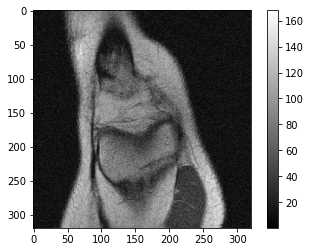

In [5]:
imshow(abs(image_gt[0,:,:,0]), cmap='gray'); colorbar();

In [6]:
import jax
import jax.numpy as jnp
import tensorflow_probability as tfp; tfp = tfp.experimental.substrates.jax
from nsec.samplers import ScoreHamiltonianMonteCarlo, ScoreMetropolisAdjustedLangevinAlgorithm

def score_fn(x, sigma):
    return score(x.reshape((-1,320,320,1)), sigma.reshape((-1,1,1,1)), is_training=False)[0].reshape((-1, 320*320))

In [7]:
score_fn(jnp.abs(image_gt), np.zeros([1,1,1,1]))

DeviceArray([[-278.1406 +117.3964j  ,  269.68845 -68.53727j ,
               177.46   +132.27397j , ...,  -44.27259+148.80347j ,
              -133.60175+123.641594j, -322.89688 +58.11428j ]],            dtype=complex64)

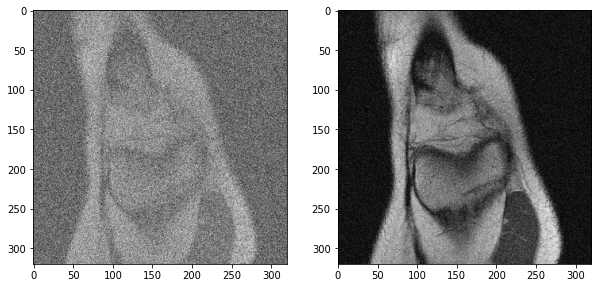

In [8]:
figure(figsize=[10,5])
subplot(121)
imshow(abs(image_gt[0,:,:,0]) + 50*randn(320,320), cmap='gray'); 
subplot(122)
noise= 1
imshow(abs( image_gt.reshape([-1]) - noise**2*score_fn((image_gt), noise*np.ones([1,1,1,1]))).reshape((320,320)),cmap='gray'); 

In [9]:
fourier_obj = FFT2(mask[0])
x_zfilled = fourier_obj.adj_op(kspace[0, ..., 0])[None, ..., None]

/local/home/flanusse/.local/lib/python3.8/site-packages/jax/numpy/lax_numpy.py:1674: FutureWarning: jax.numpy reductions won't accept lists and tuples in future versions, only scalars and ndarrays
  warnings.warn(msg, category=FutureWarning)


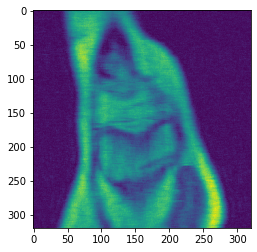

In [10]:
imshow(np.abs(x_zfilled[0,:,:,0]))

In [35]:
soft_dc_sigma=0.1

In [36]:
##### DANGER ZONE
def likelihood_fn(x_, sigma):
    """ This is a likelihood function for masked and noisy data
    """
    current_measurements = fourier_obj.op(x_[..., 0] + 1j * x_[..., 1])
    likelihood = (jnp.linalg.norm(kspace[0, ..., 0] - current_measurements)**2 / (soft_dc_sigma**2+sigma**2)) /2.
    likelihood = jnp.squeeze(likelihood)
    return likelihood
score_likelihood = jax.vmap(jax.grad(likelihood_fn))

def score_fn(x, sigma):
    x_float = x.reshape((1, image_size, image_size, 2))
    x_complex = x_float[..., 0] + 1j * x_float[..., 1]
    prior = score(x_complex[..., None], sigma.reshape((-1,1,1,1)), is_training=False)[0]
    prior = jnp.concatenate([prior.real, prior.imag], axis=-1)
    data_consistency = score_likelihood(x_float, sigma.reshape((-1,1,1,1)))
    return ( prior - data_consistency).reshape((-1, image_size*image_size*2))

In [37]:
initial_sigma = 300

In [38]:
z = jax.random.normal(jax.random.PRNGKey(0), shape=x_zfilled.shape)
z = z + 1j * jax.random.normal(jax.random.PRNGKey(0), shape=x_zfilled.shape)
z = z*initial_sigma

#         init_image = x_zfilled + z
init_image = x_zfilled + z# image_gt# x_zfilled# (26+1j*26)x_zfilled
init_image = jnp.concatenate([init_image.real, init_image.imag], axis=-1)
init_image = init_image.reshape((-1, 2*image_size**2))

(-0.5, 319.5, 319.5, -0.5)

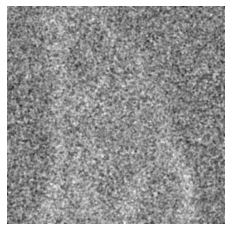

In [39]:
from scipy.ndimage import gaussian_filter
imshow(gaussian_filter(init_image.reshape((320, 320,2))[...,0],1),cmap='gray'); axis('off')

In [81]:
init_kernel = ScoreHamiltonianMonteCarlo(
      target_score_fn=lambda x: score_fn(x, 10*np.ones([1,1,1,1])).squeeze(),
      step_size=0.5,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

In [82]:
num_results = int(1e2)
num_burnin_steps = int(0)

In [91]:
2*(10/s0)**0.5

0.3651483716701107

In [84]:
samples_init, trace_init = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=samples[200].squeeze(),
        kernel=init_kernel,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=0,
        trace_fn=lambda _, pkr: pkr.is_accepted,
        seed=jax.random.PRNGKey(10))

In [85]:
print(mean(trace_init))

0.91999996


(-0.5, 319.5, 319.5, -0.5)

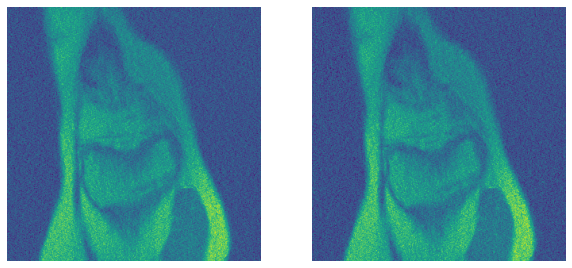

In [86]:
figure(figsize=(10,5))
subplot(121)
imshow(samples[200].reshape((320, 320,2))[...,0]); axis('off')
subplot(122)
imshow(samples_init[-1].reshape((320, 320,2))[...,0]); axis('off')

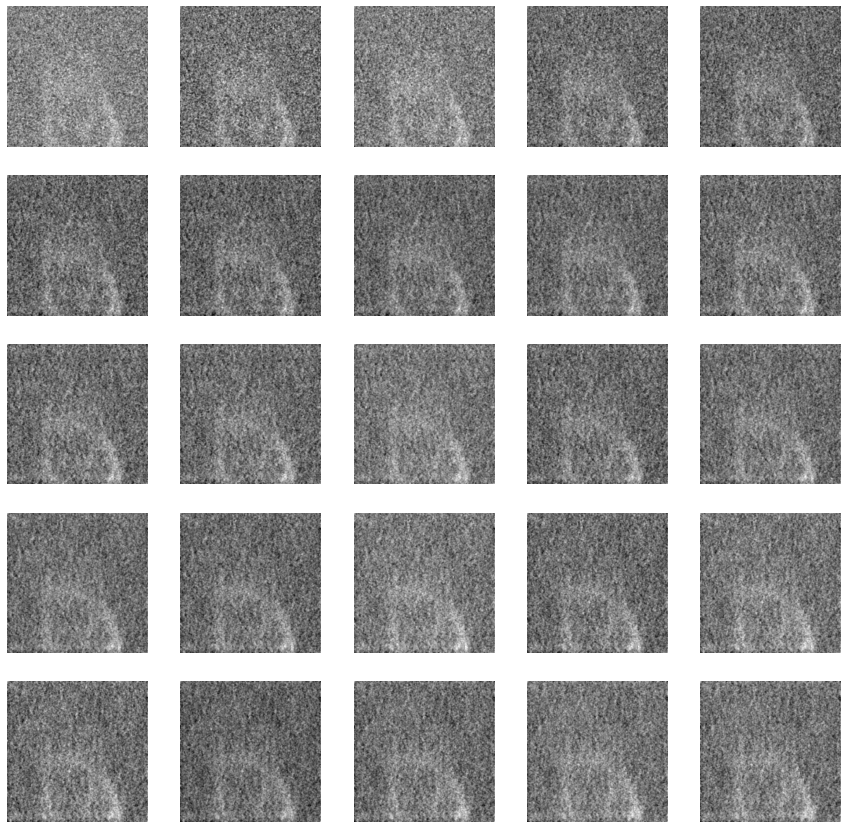

In [36]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(gaussian_filter(samples_init[(i*5+j)*40].reshape((320, 320,2))[...,0],1),cmap='gray'); axis('off')

In [51]:
from nsec.tempered_sampling import TemperedMC

In [52]:
s0=300
def make_kernel_fn(target_log_prob_fn, target_score_fn, sigma):
  return ScoreHamiltonianMonteCarlo(
      target_log_prob_fn=target_log_prob_fn,
      target_score_fn=target_score_fn,
      step_size=10*(np.max(sigma)/s0)**0.5,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

tmc = TemperedMC(
            target_score_fn=score_fn,
            inverse_temperatures=s0*np.ones([1]),
            make_kernel_fn=make_kernel_fn,
            gamma=0.98,
            min_steps_per_temp=10,
            num_delta_logp_steps=4)

num_results = int(4e2)
num_burnin_steps = int(0)

samples, trace = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=init_image.reshape((1,-1)),# samples_init[-1].reshape((1,-1)),
        kernel=tmc,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=10,
        trace_fn=lambda _, pkr: (pkr.pre_tempering_results.is_accepted,
                                 pkr.post_tempering_inverse_temperatures,
                                 pkr.tempering_log_accept_ratio),
        seed=jax.random.PRNGKey(0))

/local/home/flanusse/.local/lib/python3.8/site-packages/jax/lax/lax.py:6193: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  warnings.warn(msg.format(dtype, fun_name , truncated_dtype))


[Traced<ShapedArray(float32[1,204800]):JaxprTrace(level=1/0)>]


In [53]:
300*0.98**400

0.09280075974171315

Text(0.5, 1.0, 'accept tempering')

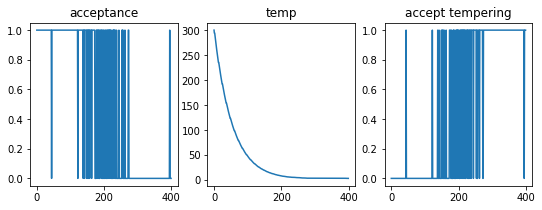

In [54]:
figure(figsize=(9,3))
subplot(131)
plot(trace[0]);
title('acceptance')
subplot(132)
plot(trace[1]);
title('temp')
subplot(133)
plot(exp(trace[2]));
title('accept tempering')

In [61]:
trace[1][200]

DeviceArray([8.229322], dtype=float32)

(-0.5, 319.5, 319.5, -0.5)

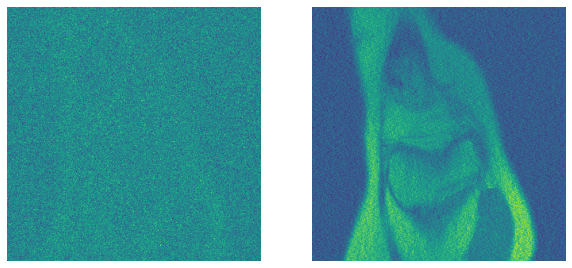

In [57]:
figure(figsize=(10,5))
subplot(121)
imshow(samples[0].reshape((320, 320,2))[...,0]); axis('off')
subplot(122)
imshow(samples[-1].reshape((320, 320,2))[...,0]); axis('off')

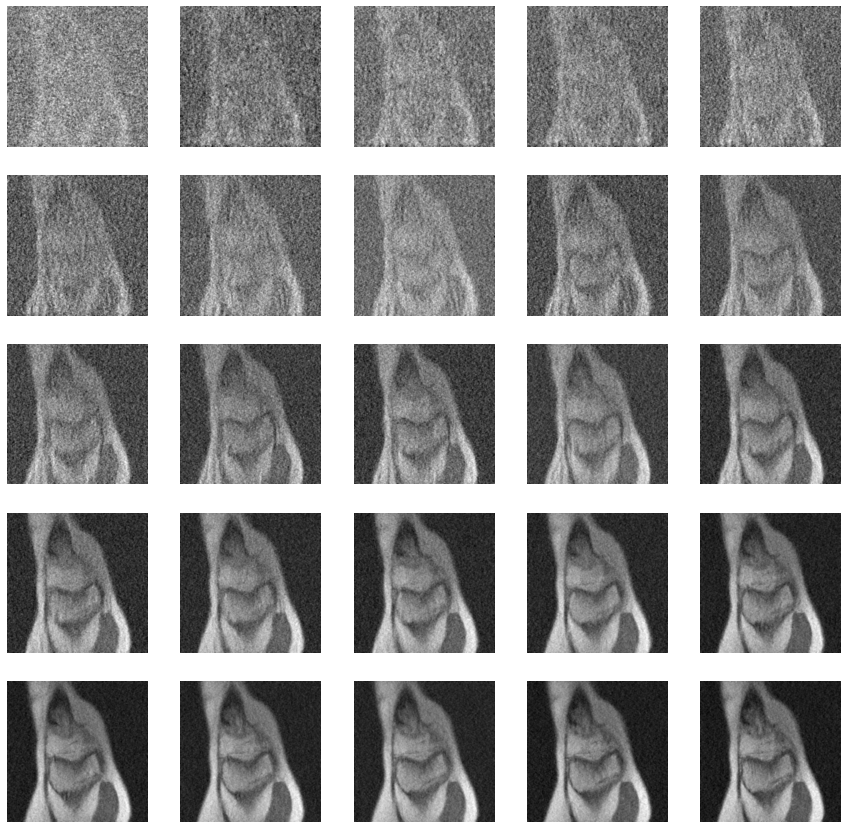

In [58]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(gaussian_filter(samples[(i*5+j)*8].reshape((320, 320,2))[...,0],1),cmap='gray'); axis('off')

Text(0.5, 1.0, 'ground truth')

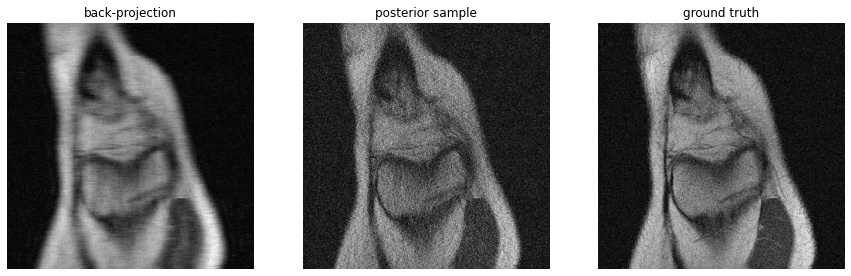

In [59]:
figure(figsize=(15,5))
subplot(131)
imshow(np.abs(x_zfilled[0,:,:,0]),cmap='gray'); axis('off')
title('back-projection')
subplot(132)
imshow(np.abs(samples[-1].reshape((320, 320,2))[...,0]+
              1j*samples[-1].reshape((320, 320,2))[...,1]),cmap='gray'); axis('off')

title('posterior sample')
subplot(133)
imshow(abs(image_gt[0,:,:,0]),cmap='gray'); axis('off')
title('ground truth')

Text(0.5, 1.0, 'ground truth')

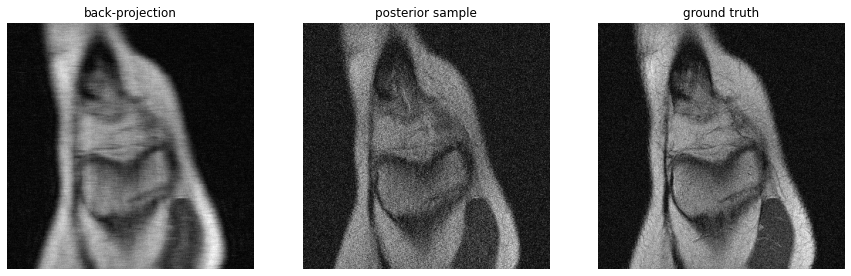

In [33]:
figure(figsize=(15,5))
subplot(131)
imshow(np.abs(x_zfilled[0,:,:,0]),cmap='gray'); axis('off')
title('back-projection')
subplot(132)
imshow(np.abs(samples[-1].reshape((320, 320,2))[...,0]+
              1j*samples[-1].reshape((320, 320,2))[...,1]),cmap='gray'); axis('off')

title('posterior sample')
subplot(133)
imshow(abs(image_gt[0,:,:,0]),cmap='gray'); axis('off')
title('ground truth')

In [124]:
s1=10
def make_kernel_fn(target_log_prob_fn, target_score_fn, sigma):
  return ScoreHamiltonianMonteCarlo(
      target_log_prob_fn=target_log_prob_fn,
      target_score_fn=target_score_fn,
      step_size=0.5*(np.max(sigma)/s1)**0.5,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

tmc = TemperedMC(
            target_score_fn=score_fn,
            inverse_temperatures=s1*np.ones([1]),
            make_kernel_fn=make_kernel_fn,
            gamma=0.98,
            min_steps_per_temp=10,
            num_delta_logp_steps=4)

num_results = int(2e2)
num_burnin_steps = int(0)

samples2, trace2 = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=samples[200].reshape((1,-1)),# samples_init[-1].reshape((1,-1)),
        kernel=tmc,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=10,
        trace_fn=lambda _, pkr: (pkr.pre_tempering_results.is_accepted,
                                 pkr.post_tempering_inverse_temperatures,
                                 pkr.tempering_log_accept_ratio),
        seed=jax.random.PRNGKey(1))

/local/home/flanusse/.local/lib/python3.8/site-packages/jax/lax/lax.py:6193: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  warnings.warn(msg.format(dtype, fun_name , truncated_dtype))


[Traced<ShapedArray(float32[1,204800]):JaxprTrace(level=1/0)>]


In [125]:
10*0.98**200

0.175879466057215

Text(0.5, 1.0, 'accept tempering')

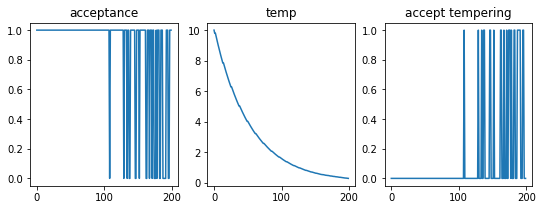

In [126]:
figure(figsize=(9,3))
subplot(131)
plot(trace2[0]);
title('acceptance')
subplot(132)
plot(trace2[1]);
title('temp')
subplot(133)
plot(exp(trace2[2]));
title('accept tempering')

In [104]:
trace2[1][-1]

DeviceArray([1.6231093], dtype=float32)

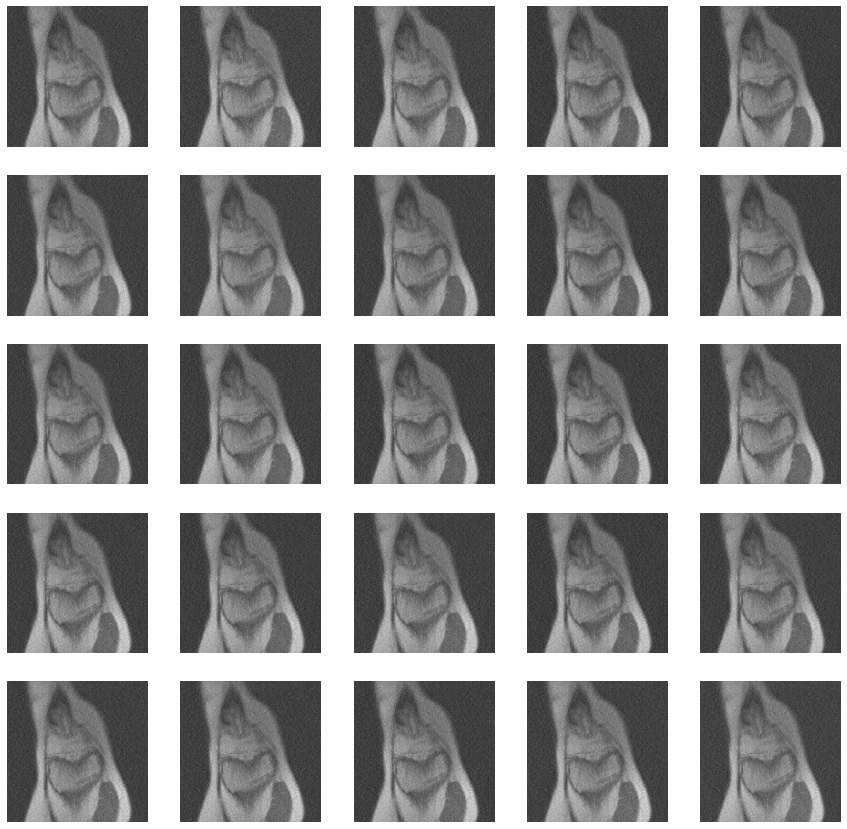

In [100]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(samples2[(i*5+j)*4].reshape((320, 320,2))[...,0],cmap='gray'); axis('off')

Text(0.5, 1.0, 'ground truth')

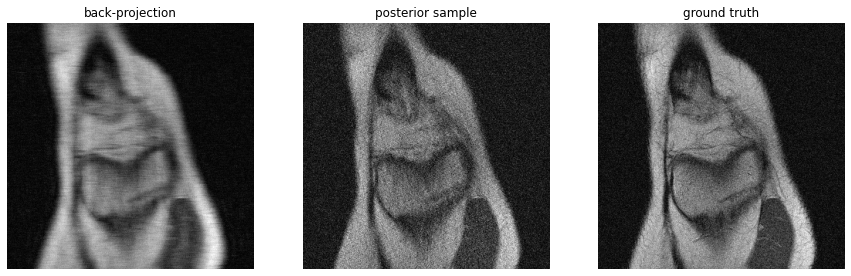

In [103]:
figure(figsize=(15,5))
subplot(131)
imshow(np.abs(x_zfilled[0,:,:,0]),cmap='gray'); axis('off')
title('back-projection')
subplot(132)
imshow(np.abs(samples2[-1].reshape((320, 320,2))[...,0]+
              1j*samples2[-1].reshape((320, 320,2))[...,1]),cmap='gray'); axis('off')

title('posterior sample')
subplot(133)
imshow(abs(image_gt[0,:,:,0]),cmap='gray'); axis('off')
title('ground truth')

Text(0.5, 1.0, 'ground truth')

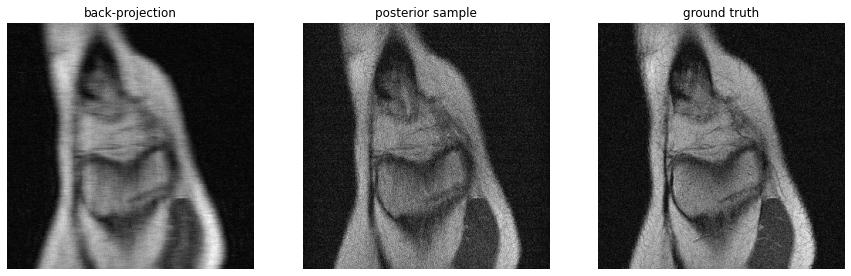

In [127]:
figure(figsize=(15,5))
subplot(131)
imshow(np.abs(x_zfilled[0,:,:,0]),cmap='gray'); axis('off')
title('back-projection')
subplot(132)
imshow(np.abs(samples2[-1].reshape((320, 320,2))[...,0]+
              1j*samples2[-1].reshape((320, 320,2))[...,1]),cmap='gray'); axis('off')

title('posterior sample')
subplot(133)
imshow(abs(image_gt[0,:,:,0]),cmap='gray'); axis('off')
title('ground truth')

In [107]:
def score_fn0(x, sigma):
    return score(x.reshape((-1,320,320,1)), sigma.reshape((-1,1,1,1)), is_training=False)[0].reshape((-1, 320*320))

(-0.5, 319.5, 319.5, -0.5)

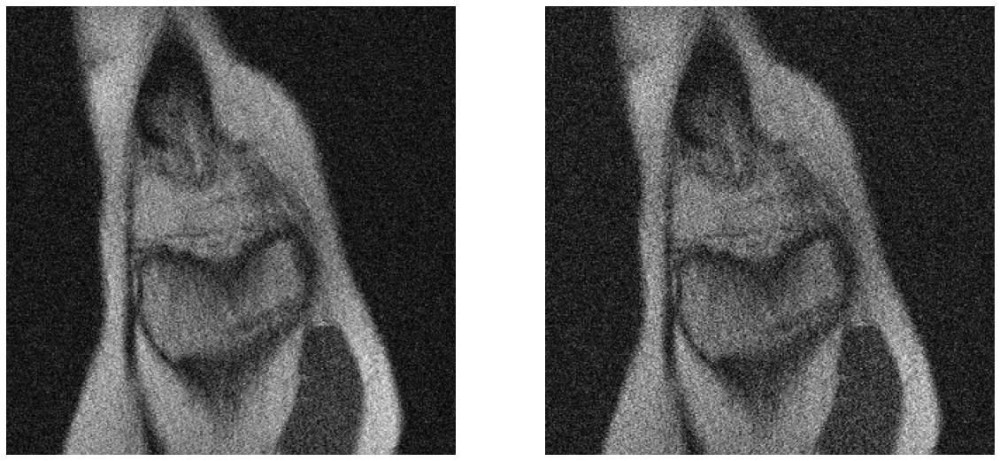

In [117]:
figure(figsize=[20,10])
subplot(121)
imshow(np.abs(samples2[-1].reshape((320, 320,2))[...,0]+
              1j*samples2[-1].reshape((320, 320,2))[...,1]),cmap='gray'); axis('off')
subplot(122)
noise=10
im = (samples2[-1].reshape((320, 320,2))[...,0]+
              1j*samples2[-1].reshape((320, 320,2))[...,1])
imshow(abs( im.reshape([-1]) - noise**2*score_fn0(im, noise*np.ones([1,1,1,1]))).reshape((320,320)),cmap='gray');  axis('off')

(-0.5, 319.5, 319.5, -0.5)

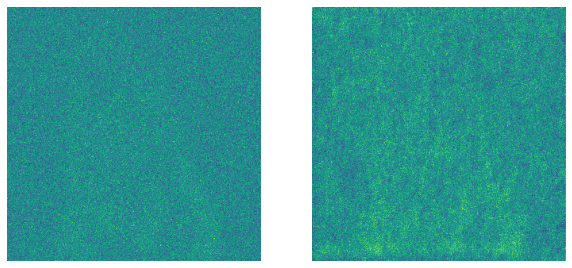

In [273]:
figure(figsize=(10,5))
subplot(121)
imshow(init_image.reshape((320, 320,2))[...,0]); axis('off')
subplot(122)
imshow(samples_init[-1].reshape((320, 320,2))[...,0]); axis('off')

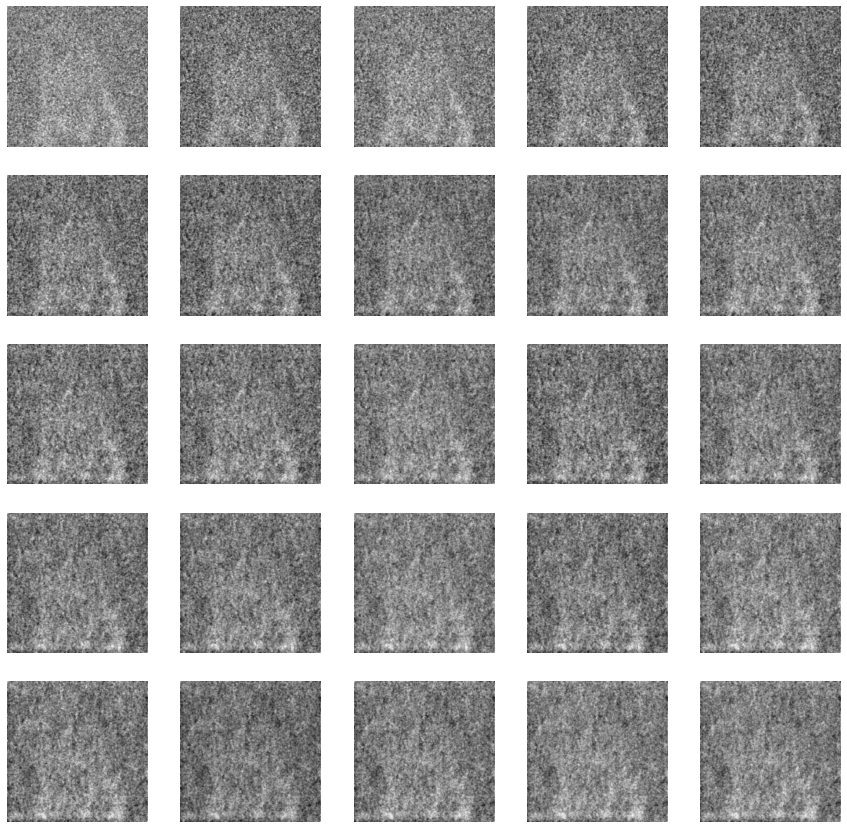

In [274]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(gaussian_filter(samples_init[(i*5+j)*40].reshape((320, 320,2))[...,0],1),cmap='gray'); axis('off')

(-0.5, 319.5, 319.5, -0.5)

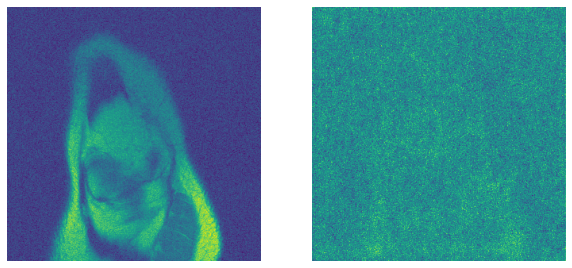

In [258]:
figure(figsize=(10,5))
subplot(121)
imshow(init_image.reshape((320, 320,2))[...,0]); axis('off')
subplot(122)
imshow(samples_init[-1].reshape((320, 320,2))[...,0]); axis('off')

In [259]:
from scipy.ndimage import gaussian_filter

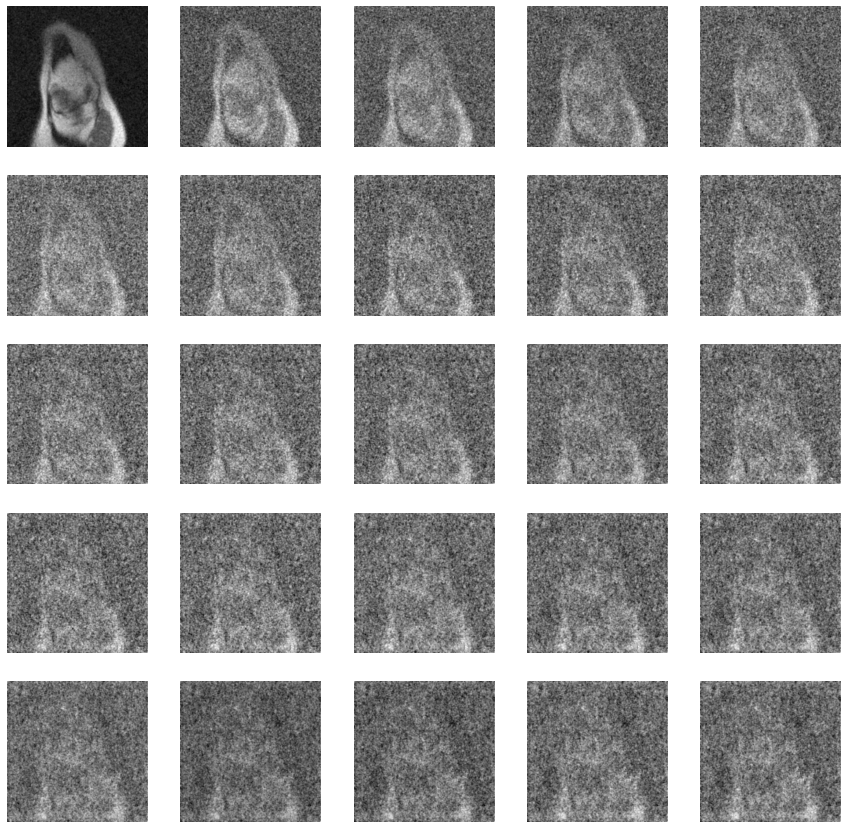

In [260]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(gaussian_filter(samples_init[(i*5+j)*40].reshape((320, 320,2))[...,0],1),cmap='gray'); axis('off')

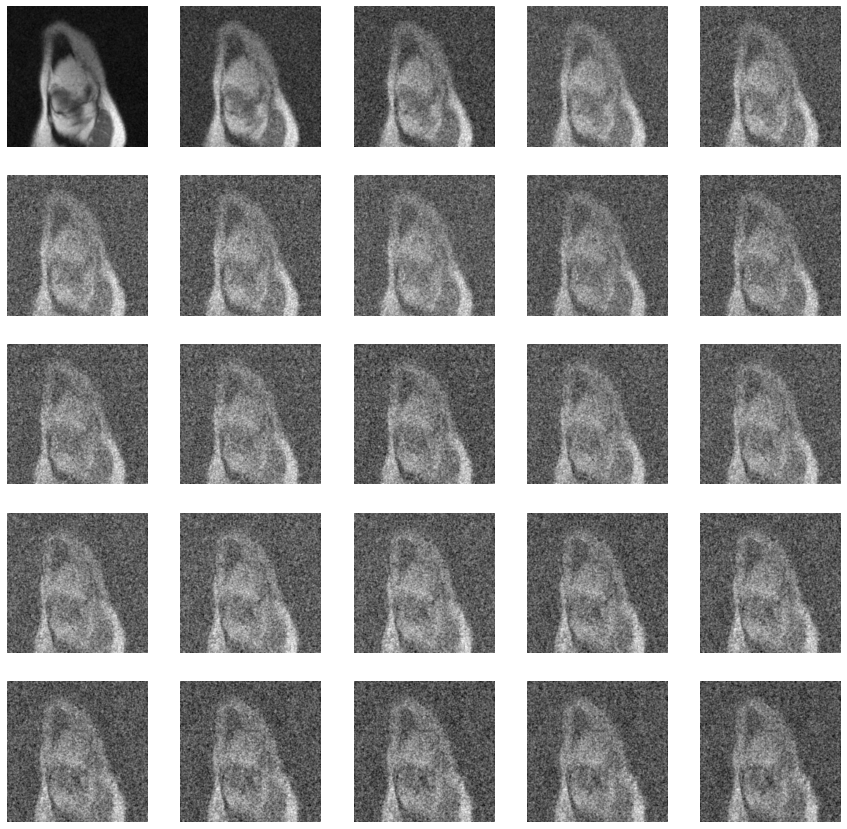

In [204]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(gaussian_filter(samples_init[(i*5+j)*40].reshape((320, 320,2))[...,0],1),cmap='gray'); axis('off')

In [226]:
g = score_fn(samples_init[-1].squeeze(), 100*np.ones([1,1,1,1])).reshape((320,320,2))

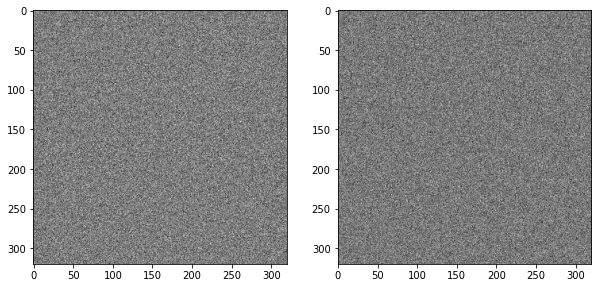

In [227]:
figure(figsize=[10,5])
subplot(121)
imshow(g[...,0],cmap='gray');

subplot(122)
imshow(g[...,1],cmap='gray'); 

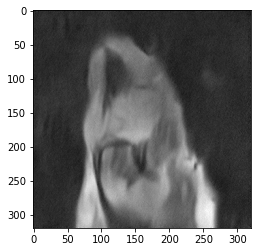

In [229]:
imshow((samples_init[-1].reshape((320,320,2)) + 100**2*g)[...,0],cmap='gray')

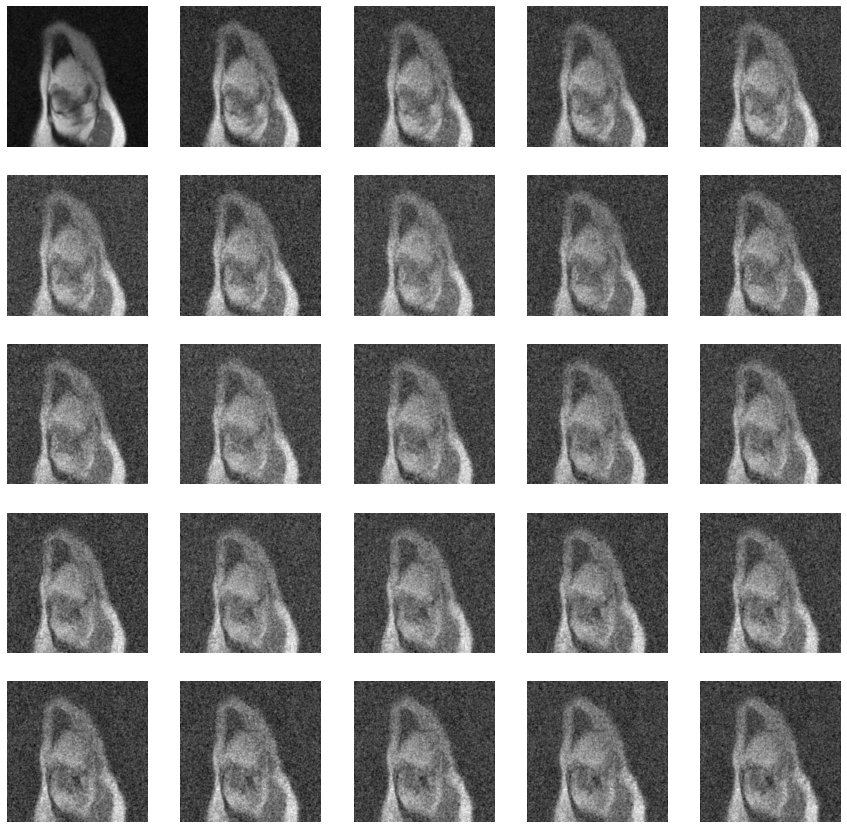

In [165]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(gaussian_filter(samples_init[(i*5+j)*40].reshape((320, 320,2))[...,0],1),cmap='gray'); axis('off')

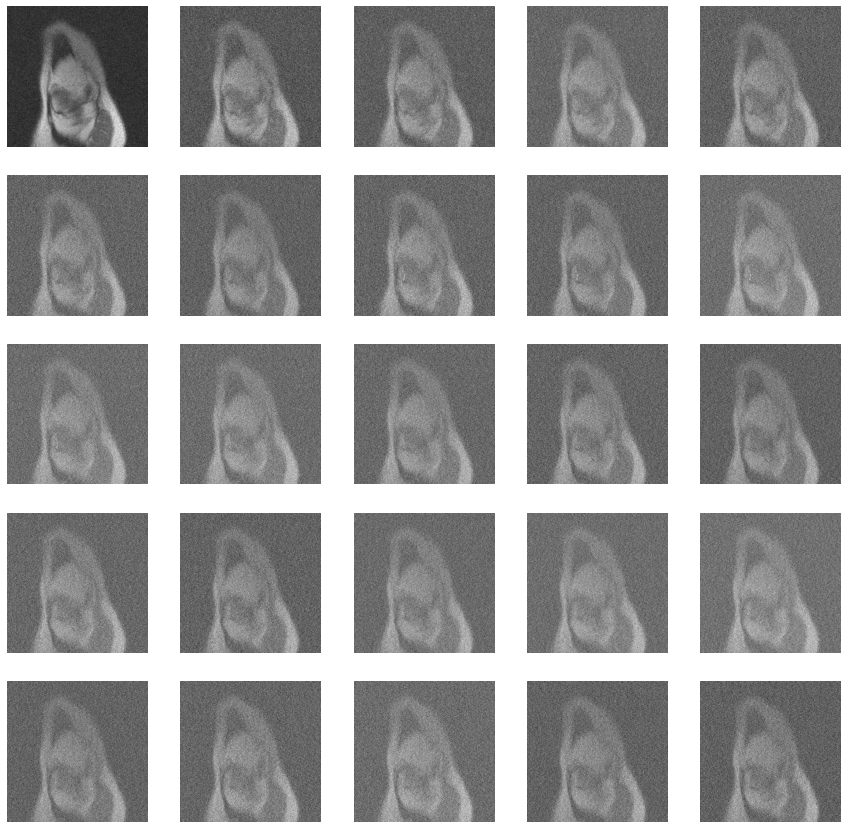

In [155]:
figure(figsize=[15,15])
for i in range(5):
    for j in range(5):
        subplot(5,5,i*5+j+1)
        imshow(samples_init[(i*5+j)*40].reshape((320, 320,2))[...,0],cmap='gray'); axis('off')

In [4]:
(np.mean(image_gt.real) + np.mean(image_gt.imag))/2

5.656258264673167

In [6]:
# sampling setup
initial_sigma=100.
num_results=200
eps=2*1e0
soft_dc_sigma=100.
n_repetitions=1

/local/home/flanusse/.local/lib/python3.8/site-packages/jax/lax/lax.py:6193: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  warnings.warn(msg.format(dtype, fun_name , truncated_dtype))


[Traced<ShapedArray(float32[1,204800]):JaxprTrace(level=1/0)>]


<IPython.core.display.Javascript object>


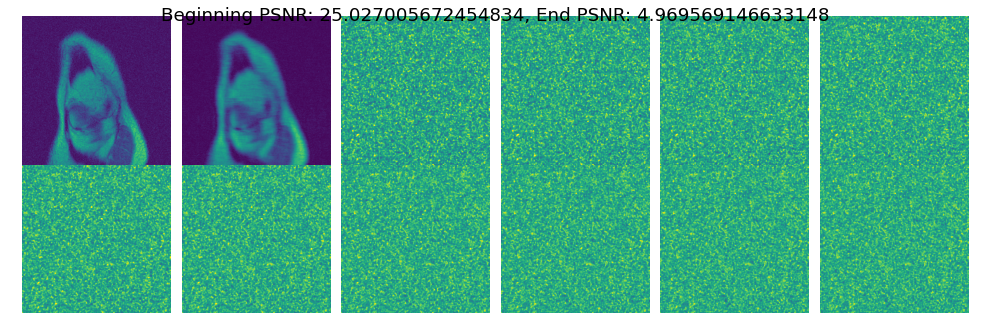

<IPython.core.display.Javascript object>


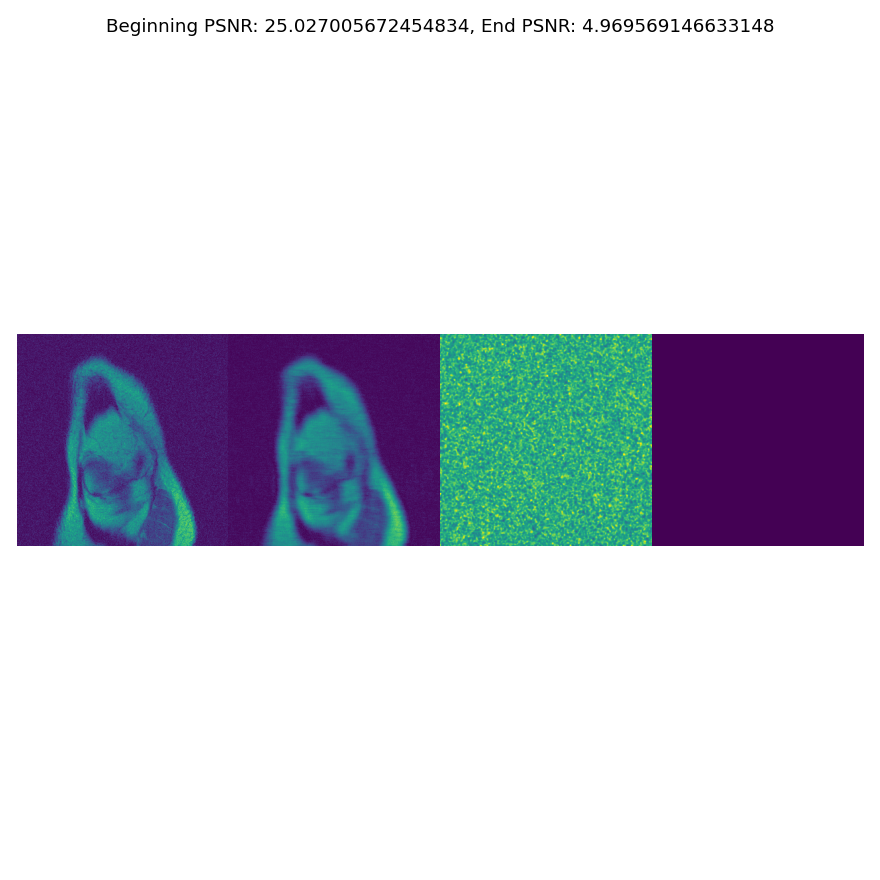

CPU times: user 1min 6s, sys: 18.7 s, total: 1min 25s
Wall time: 1min 29s


In [7]:
%%time
for ind in range(batch_size):
    fourier_obj = FFT2(mask[ind])
    x_zfilled = fourier_obj.adj_op(kspace[ind, ..., 0])[None, ..., None]
    final_samples = []
    for j in range(n_repetitions):
        ##### ACTUAL SAMPLING ZONE
        def likelihood_fn(x_, sigma):
            """ This is a likelihood function for masked and noisy data
            """
            current_measurements = fourier_obj.op(x_[..., 0] + 1j * x_[..., 1])
            likelihood = (jnp.linalg.norm(kspace[ind, ..., 0] - current_measurements) / (soft_dc_sigma+sigma))**2 /2.
            likelihood = jnp.squeeze(likelihood)
            return likelihood
        score_likelihood = jax.vmap(jax.grad(likelihood_fn))
        def score_fn(x, sigma):
            x_float = x.reshape((1, image_size, image_size, 2))
            x_complex = x_float[..., 0] + 1j * x_float[..., 1]
            prior = score(x_complex[..., None], sigma.reshape((-1,1,1,1)), is_training=False)[0]
            prior = jnp.concatenate([prior.real, prior.imag], axis=-1)
            data_consistency = score_likelihood(x_float, sigma.reshape((-1,1,1,1)))
            return ( prior - data_consistency).reshape((-1, image_size*image_size*2))

        z = jax.random.normal(jax.random.PRNGKey(j), shape=x_zfilled.shape)
        z = z + 1j * jax.random.normal(jax.random.PRNGKey(j), shape=x_zfilled.shape)
        z = z*initial_sigma
#         init_image = x_zfilled + z
        init_image = z + (26+1j*26)
        init_image = jnp.concatenate([init_image.real, init_image.imag], axis=-1)
        init_image = init_image.reshape((-1, 2*image_size**2))

        def make_kernel_fn(target_log_prob_fn, target_score_fn, sigma):
          return ScoreHamiltonianMonteCarlo(
              target_log_prob_fn=target_log_prob_fn,
              target_score_fn=target_score_fn,
              step_size=eps*(sigma/initial_sigma)**0.5,
              num_leapfrog_steps=3,
              num_delta_logp_steps=4)

        tmc = TemperedMC(
                    target_score_fn=score_fn,
                    inverse_temperatures=initial_sigma*np.ones([1]),
                    make_kernel_fn=make_kernel_fn,
                    gamma=0.99,
                    min_steps_per_temp=10,
                    num_delta_logp_steps=4)

        num_burnin_steps = int(1e1)

        samples, trace = tfp.mcmc.sample_chain(
                num_results=10,
                num_steps_between_results=num_results//10,
                current_state=init_image,
                kernel=tmc,
                num_burnin_steps=num_burnin_steps,
                trace_fn=lambda _, pkr: (pkr.pre_tempering_results.is_accepted,
                                         pkr.post_tempering_inverse_temperatures,
                                         pkr.tempering_log_accept_ratio),
                seed=jax.random.PRNGKey(j))
        ##### END OF SAMPLING ZONE
        fig, axs = plt.subplots(2, 6, sharex=True, sharey=True, figsize=(9, 3), gridspec_kw={'wspace': 0, 'hspace': 0})
        target_image = jnp.squeeze(jnp.abs(image_gt[ind]))
        axs[0, 0].imshow(target_image, vmin=0, vmax=200)
        axs[0, 0].axis('off')
        axs[0, 1].imshow(jnp.squeeze(jnp.abs(x_zfilled[0])), vmin=0, vmax=200)
        axs[0, 1].axis('off')
        for i in range(10):
            im = samples[i].reshape((image_size, image_size, 2))
            im = jnp.linalg.norm(im, axis=-1)
            im = jnp.squeeze(im)
            im = gaussian_filter(im, 1)
            if i < 4:
                ax = axs[0, i+2]
            else:
                ax = axs[1, i - 4]
            ax.imshow(im, vmin=0, vmax=200)
            ax.axis('off')
        plt.tight_layout()
        beginning_psnr = psnr(
            target_image,
            jnp.squeeze(jnp.abs(x_zfilled[0])),
            data_range=jnp.max(target_image) - jnp.min(target_image),
        )
        end_psnr = psnr(
            target_image,
            im,
            data_range=jnp.max(target_image) - jnp.min(target_image),
        )
        fig.suptitle(f'Beginning PSNR: {beginning_psnr}, End PSNR: {end_psnr}')
        final_samples.append(im)
    mean_samples = np.mean(final_samples, axis=0)
    std_samples = np.std(final_samples, axis=0)
    fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(8, 8), gridspec_kw={'wspace': 0, 'hspace': 0})
    axs[0].imshow(target_image, vmin=0, vmax=200)
    axs[0].axis('off')
    axs[1].imshow(jnp.squeeze(jnp.abs(x_zfilled[0])), vmin=0, vmax=200)
    axs[1].axis('off')
    axs[2].imshow(jnp.squeeze(mean_samples), vmin=0, vmax=200)
    axs[2].axis('off')
    axs[3].imshow(jnp.squeeze(std_samples))
    axs[3].axis('off')
    plt.tight_layout()
    end_psnr = psnr(
        target_image,
        jnp.squeeze(mean_samples),
        data_range=jnp.max(target_image) - jnp.min(target_image),
    )
    fig.suptitle(f'Beginning PSNR: {beginning_psnr}, End PSNR: {end_psnr}')

<IPython.core.display.Javascript object>


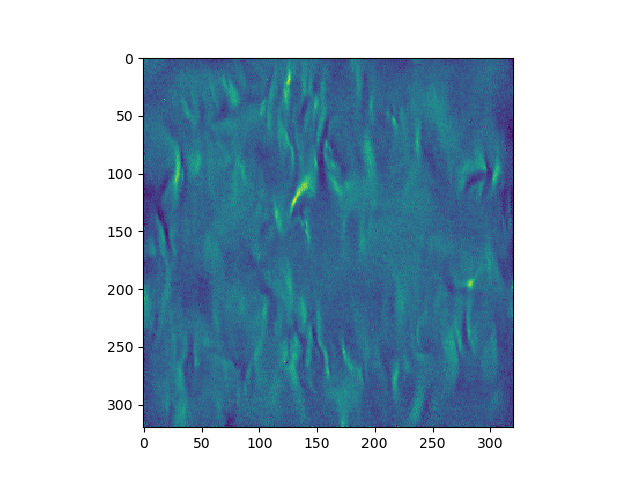

In [92]:
plt.figure()
im_float = init_image.reshape((1, image_size, image_size, 2))
im_complex = im_float[..., 0] + 1j * im_float[..., 1]
im_complex = im_complex[..., None]
plt.imshow(jnp.abs(jnp.squeeze(im_complex + initial_sigma**2 * score(im_complex, jnp.array(initial_sigma).reshape((-1,1,1,1)), is_training=False)[0])))

<IPython.core.display.Javascript object>


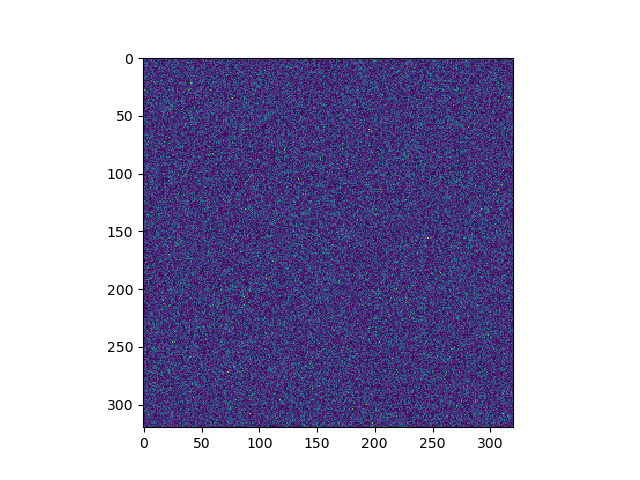

In [93]:
plt.figure()
im_begin = samples[0].reshape((image_size, image_size, 2))
im_begin = jnp.linalg.norm(im_begin, axis=-1)
im_begin = jnp.squeeze(im_begin)
im_end = samples[-1].reshape((image_size, image_size, 2))
im_end = jnp.linalg.norm(im_end, axis=-1)
im_end = jnp.squeeze(im_end)
plt.imshow(np.abs(im_end - im_begin))

<IPython.core.display.Javascript object>


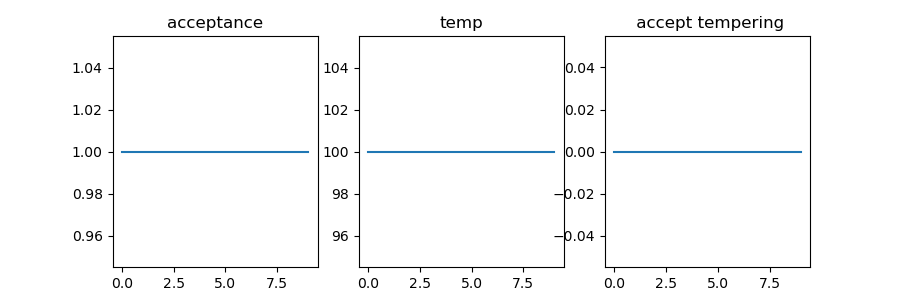

Text(0.5,1,' accept tempering')

In [94]:
plt.figure(figsize=(9,3))
plt.subplot(131)
plt.plot(trace[0]);
plt.title('acceptance')
plt.subplot(132)
plt.plot(trace[1]);
plt.title('temp')
plt.subplot(133)
plt.plot(np.clip(np.exp(trace[2]),0,1));
plt.title(' accept tempering')